## Run CellRank on endothelia subset

In [1]:
# import standard packages
import numpy as np
import pandas as pd 

import matplotlib.pyplot as plt
import seaborn as sb

import os
import sys
from typing import Optional

# import custom functions
import sc_toolbox as sct

# import single-cell packages
import scanpy as sc
import scanpy.external as sce
import scvelo as scv
import cellrank as cr
from anndata import AnnData

# set verbosity levels
sc.settings.verbosity = 3
cr.settings.verbosity = 3
scv.settings.verbosity = 3 

In [2]:
## reproducibility
# making sure plots & clusters are reproducible
np.random.seed(42)
sc.logging.print_version_and_date()

Running Scanpy 1.8.2, on 2022-01-31 14:05.


In [3]:
## set up paths for data
adata_dir = '/home/niklas/projects/niche_environments_FIBROSIS/PCLS_human/01_data/ASK_joint/subsets/211201_endothelia_subset_NIKLAS_annotated_LOOM.h5ad'

In [4]:
## set up the paths to save figures
fig_dir = '/home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/'
sc.settings.figdir = str(fig_dir)
scv.settings.figdir = str(fig_dir)
cr.settings.figdir = str(fig_dir)

In [5]:
## set global parameters
sc.set_figure_params(vector_friendly = True)
scv.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (6, 5)
plt.rcParams['pdf.fonttype'] = 42

### Load and prepare data

In [6]:
## load adata
adata = sc.read(adata_dir)
## explore meta data of adata object
adata

AnnData object with n_obs × n_vars = 16513 × 15662
    obs: 'condition', 'modality', 'name', 'patient', 'timepoint', 'treatment', 'identifier', 'n_counts', 'n_genes', 'percent_mito', 'QC_group', 'doublet_scores', 'size_factors', 'leiden_1', 'leiden_2', 'd_cluster', 'sub_leiden_2.2', 'auto_cell_type', 'VE Peribronchial_score', 'VE Capillary A_score', 'VE Capillary B_score', 'VE Arterial_score', 'VE Venous_score', 'cell_type', 'cell_type_group', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'n_cells', 'n_counts', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'auto_cell_type_colors', 'cell_type_colors', 'cell_type_group_colors', 'condition_colors', 'd_cluster_colors', 'dendrogram_cell_type', 'dendrogram_sub_leiden_2.2', 'hvg', 'identifier_colors', 'leiden', 'leiden_1_colors', 'leiden_2_colors', 'name_colors', 'neighbors', 'pa

In [7]:
## subset data
adata = adata[adata.obs.treatment.isin(['CC','FC'])].copy()

### Pre-processing and UMAP visualization of subset

In [8]:
## delete all obs colums related to highly variable genes
del(adata.var['highly_variable'])
del(adata.var['highly_variable_nbatches'])
del(adata.var['highly_variable_intersection'])

filtered out 730 genes that are detected in less than 1 counts
filtered out 1023 genes that are detected in less than 5 cells
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


<AxesSubplot:>

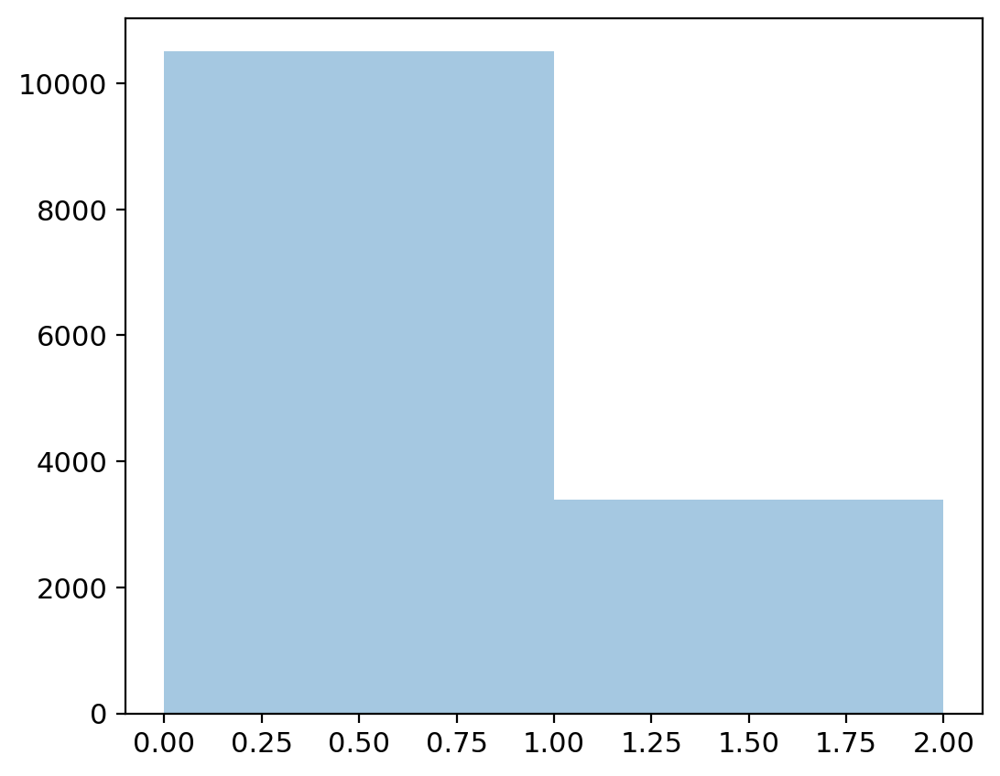

In [9]:
## filter genes
sc.pp.filter_genes(adata, min_counts = 1)
sc.pp.filter_genes(adata, min_cells = 5)## compute HVGs per batch ('identifier') using seurat method
batch = 'patient'
sc.pp.highly_variable_genes(adata, min_disp = None, max_disp = None, min_mean = None, max_mean = None, 
                                batch_key = batch, n_top_genes = 2000, n_bins = 20, flavor = 'seurat', 
                                subset = False)
vartab = pd.DataFrame(adata.var['highly_variable_nbatches'], index = adata.var_names)
sb.distplot(vartab, kde = False, bins = len(np.unique(adata.obs[batch])))

In [10]:
## only consider a gene as variable if variable in at least 10 batches
thresh = 2
hvgs = vartab[vartab.highly_variable_nbatches.values >= thresh].index
print('%s Genes kept, variable in at least %s samples' %(len(hvgs), thresh))

602 Genes kept, variable in at least 2 samples


In [11]:
## remove cell cycle genes (MOUSE) from list of HVGs
all_cc_genes = pd.read_table('/home/niklas/data/gene_lists/macosko_cell_cycle_genes.txt', header=0)
cc_genes = np.concatenate([all_cc_genes['IG1.S'], all_cc_genes['S'], all_cc_genes['G2.M'], all_cc_genes['M'], all_cc_genes['M.G1']]).astype(str)
cc_genes = [cc_genes[i] for i in np.arange(0,len(cc_genes))]
hvgs = np.setdiff1d(hvgs, cc_genes)

In [12]:
## set HVGs
adata.var['highly_variable'] = [g in hvgs for g in adata.var_names]
## no. of resulting HVGs
sum(adata.var['highly_variable'])

580

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


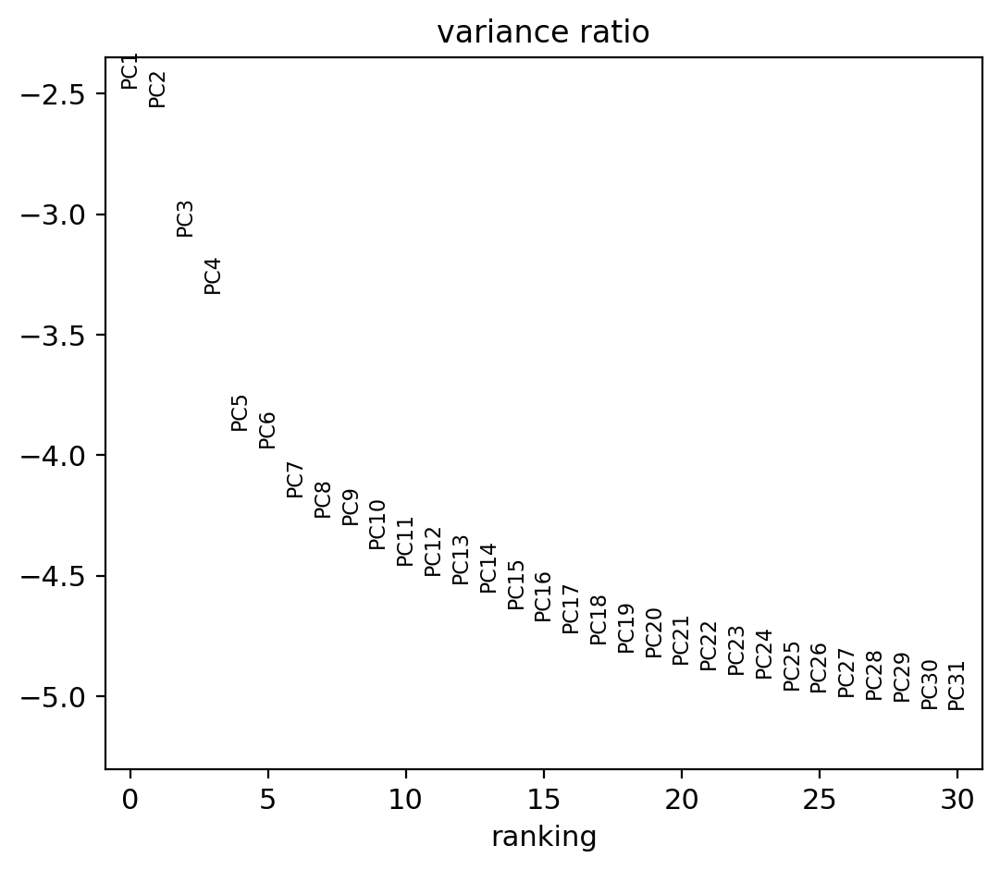

In [13]:
## PCA
sc.pp.pca(adata, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log=True)

In [14]:
## graph based clustering and recalculate UMAP
sc.pp.neighbors(adata, n_pcs = 30, n_neighbors = 30)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


### Overview

In [15]:
ct_colors = {'capillary EC' : '#1f77b4',
             'arterial EC' : '#ff7f0e',
             'venous EC' : '#279e68',
             'ectopic EC' : '#d62728',
             'lymphatic EC' : '#aa40fc'
}

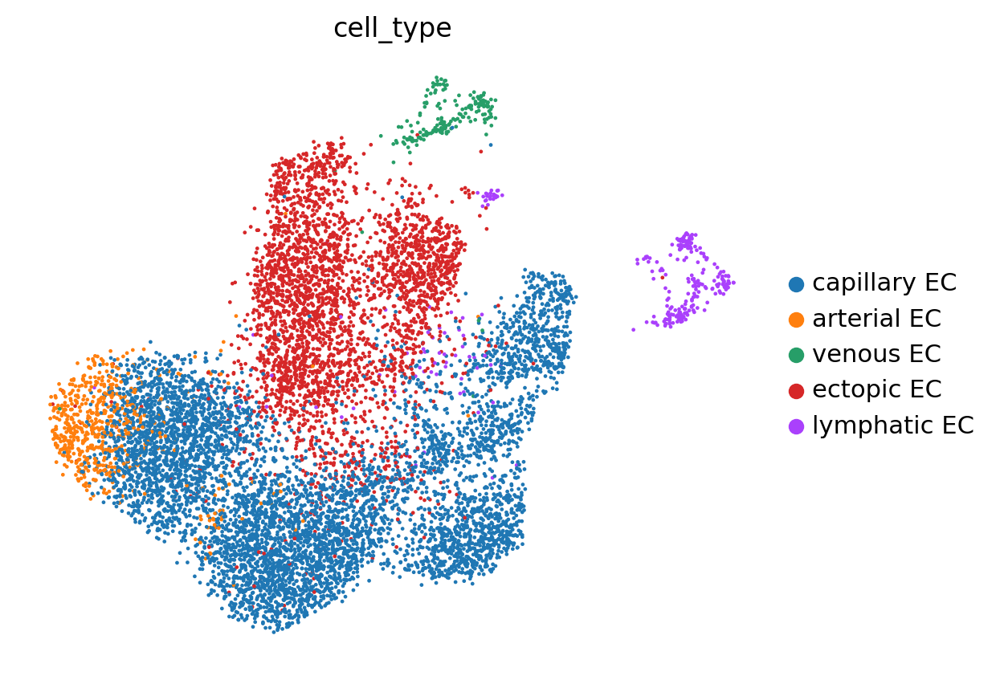

In [16]:
## overview UMAPs
sc.pl.umap(adata, color = ['cell_type'], palette = ct_colors, frameon = False, ncols = 3, wspace = 0.5)

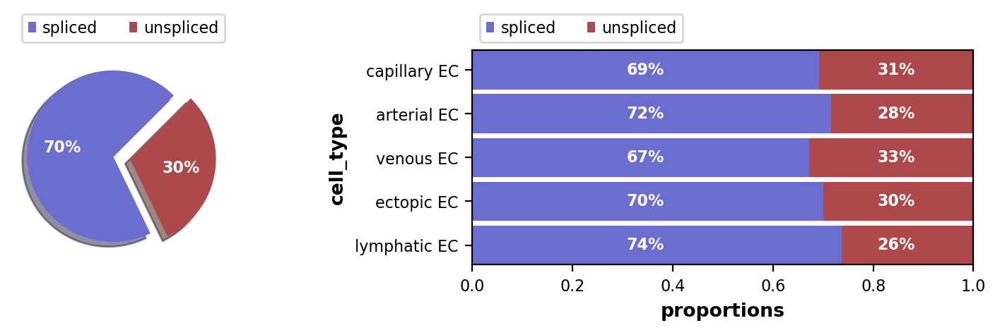

In [17]:
scv.pl.proportions(adata, groupby = 'cell_type')

### Pre-process the data for scVelo

In [18]:
adata_raw = adata.copy()
sc.pp.filter_genes(adata_raw, min_cells=10)
scv.pp.normalize_per_cell(adata_raw)
sc.pp.log1p(adata_raw)

# annotate highly variable genes, but don't filter them out
sc.pp.highly_variable_genes(adata_raw)
print(f"This detected {np.sum(adata_raw.var['highly_variable'])} highly variable genes. ")
adata.raw = adata_raw

filtered out 896 genes that are detected in less than 10 cells
Normalized count data: spliced, unspliced.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
This detected 1473 highly variable genes. 


In [19]:
# filter, normalise, log transform
scv.pp.filter_and_normalize(adata, min_shared_counts=20, log=True, n_top_genes=2000)

# compute pca, knn graph and scvelo's moments
sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 4140 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


### Compute velocities using scVelo

In [20]:
scv.tl.recover_dynamics(adata, n_jobs=64)

recovering dynamics (using 64/64 cores)


  0%|          | 0/500 [00:00<?, ?gene/s]

    finished (0:00:44) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [21]:
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/64 cores)


  0%|          | 0/10418 [00:00<?, ?cells/s]

/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


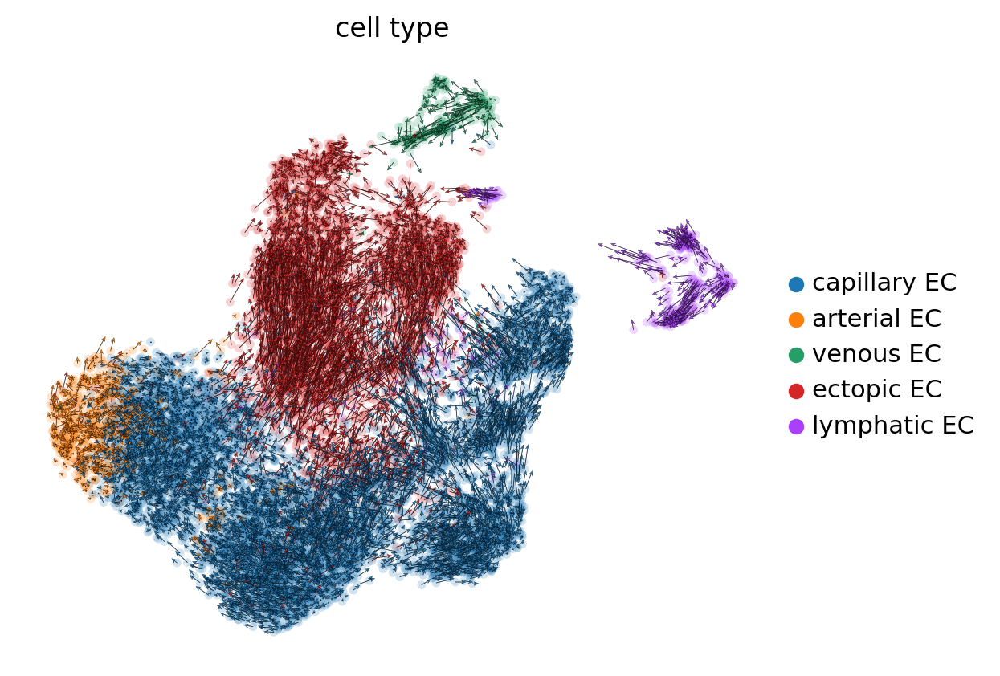

In [22]:
scv.pl.velocity_embedding(adata, color = ['cell_type'], legend_loc = 'right', scale = 0.1, size = 60)

figure cannot be saved as pdf, using png instead.
saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_endothelia_rna_velocity_streamline_plot.png


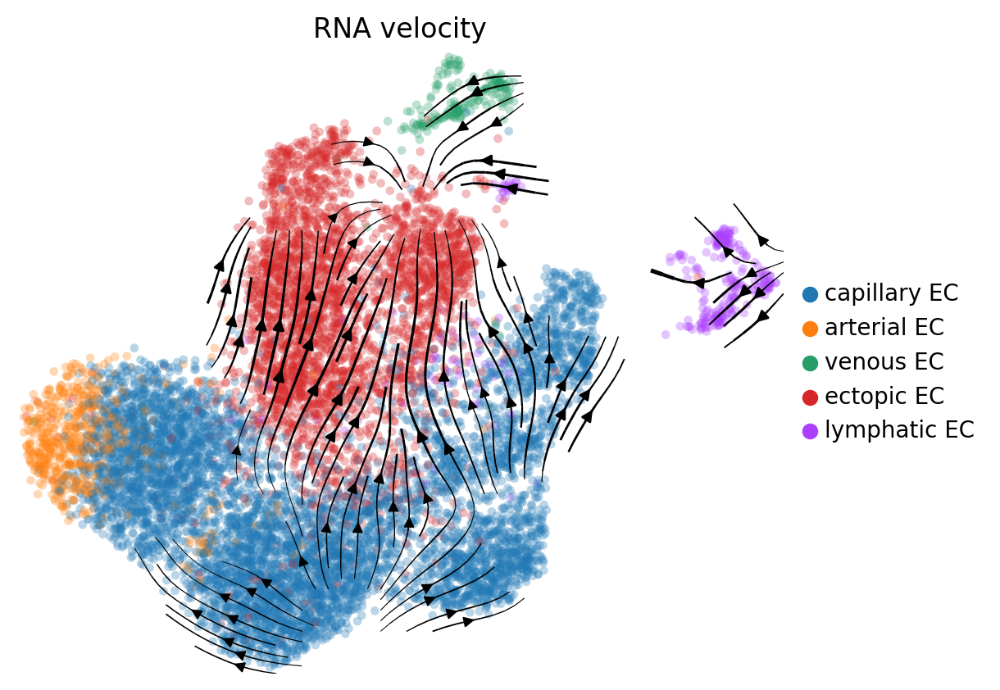

In [23]:
scv.pl.velocity_embedding_stream(adata, color = 'cell_type', basis='umap', title = 'RNA velocity',
                                 legend_fontsize = 'small', legend_fontoutline = 2, legend_loc = 'right', 
                                 smooth = 1, min_mass = 4, size = 60, save = 'endothelia_rna_velocity_streamline_plot.pdf'
                                )

In [24]:
#fig = streamline_plot.figure.savefig(fig_dir + 'endothelia_rna_velocity_streamline_plot.pdf')

saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_endothelium_top_20_gene_wise_velocities.pdf


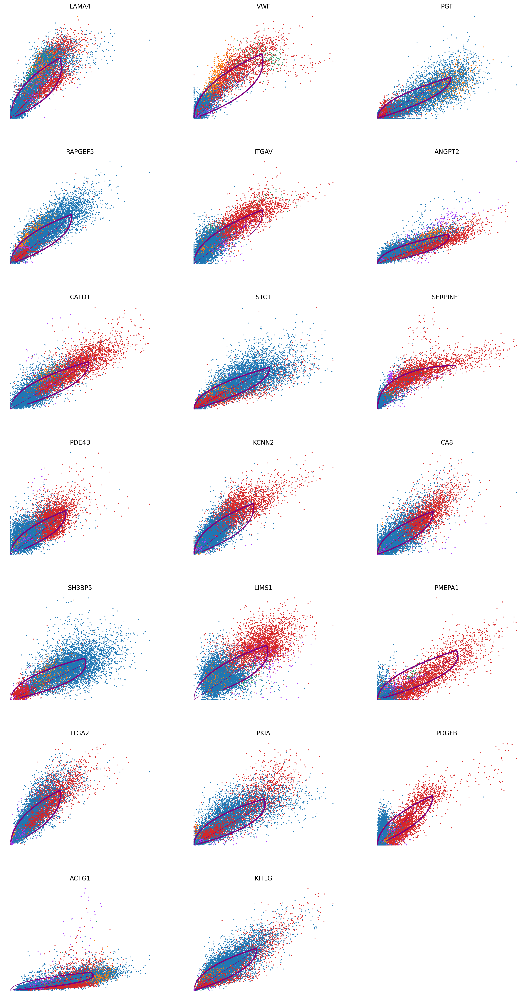

In [25]:
#### look into gene-wise velocities
high_likelihood_genes = adata.var.sort_values('fit_likelihood', ascending=False).index

# plot the first 20 genes
scv.pl.scatter(adata, color = 'cell_type', basis = high_likelihood_genes[:20], frameon = False, ncols =3, 
               save = 'endothelium_top_20_gene_wise_velocities.pdf')

### Run CellRank

In [26]:
adata

AnnData object with n_obs × n_vars = 10418 × 2000
    obs: 'condition', 'modality', 'name', 'patient', 'timepoint', 'treatment', 'identifier', 'n_counts', 'n_genes', 'percent_mito', 'QC_group', 'doublet_scores', 'size_factors', 'leiden_1', 'leiden_2', 'd_cluster', 'sub_leiden_2.2', 'auto_cell_type', 'VE Peribronchial_score', 'VE Capillary A_score', 'VE Capillary B_score', 'VE Arterial_score', 'VE Venous_score', 'cell_type', 'cell_type_group', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'velocity_self_transition'
    var: 'n_cells', 'n_counts', 'means', 'dispersions', 'dispersions_norm', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    un

In [27]:
# set the parameters we want to use to compute the transition matrix
weight_connectivities = 0.2
mode = 'stochastic' 
n_jobs = 64
softmax_scale = None

In [28]:
## initialise kernel and estimator
# another option would be `mode='monte_carlo'` and `n_samples=1000`
from cellrank.tl.estimators import GPCCA

kernel = cr.tl.transition_matrix(adata,
                                 weight_connectivities = weight_connectivities,
                                 mode = mode,
                                 n_jobs = n_jobs,
                                 softmax_scale = softmax_scale)
g = GPCCA(kernel)
print(g)

Computing transition matrix based on logits using `'stochastic'` mode


/tmp/ipykernel_308282/1247815862.py:5: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  kernel = cr.tl.transition_matrix(adata,


Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/10418 [00:00<?, ?cell/s]

Setting `softmax_scale=7.9733`


  0%|          | 0/10418 [00:00<?, ?cell/s]

    Finish (0:03:13)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
GPCCA[n=10418, kernel=((0.8 * <VelocityKernel[softmax_scale=7.97, mode=stochastic, seed=56422, scheme=<CorrelationScheme>]>) + (0.2 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
9.9999999975331544e-01 6.5450994208834934e-02 3.9253710902737479e-02 -3.9029820158185291e-02 -5.1235951501256725e-02 9.0537206785614166e-02 5.1311770440984422e-02 5.3031153491534715e-03 -5.6697226848680792e-03 4.6968176874413882e-02 5.5372970475746033e-02 9.9831911491478909e-03 -3.9947503101834612e-02 -5.4381459190749742e-02 4.4697239245953153e-02 9.3030653438109304e-03 -4.0802296962624010e-02 7.6515379035543745e-03 -5.4281120173587820e-02 1.4708248458141565e-02 4.4137364060099646e-02 -2.4044816546263399e-02 
0.0000000000000000e+00 9.2792409267102793e-01 5.6659102438364373e-04 -1.4367330588359980e-02 -1.9433504240829222e-02 5.6480179810375154e-02 8.1117118037896008e-02 1.0754525479629304e-01 -6.4022952612524414e-02 7.7462361857894512e-04 -1.1008800629589342e-01 -8.2339311801175971e-02 -1.8112556021041244e-02 1.6380997992190307e-02 -1.4569935040650635e-03 7.8952660419664034e-02 -1.9554233458935973e-02 -4.46923204

Mat Object: 1 MPI processes
  type: seqdense
9.9999999975331721e-01 -6.5450994208873209e-02 -3.9253710902676618e-02 3.9029820158188538e-02 5.1235951501321840e-02 9.0537206785576599e-02 -5.1311770440983666e-02 -5.3031153491541073e-03 5.6697226848660296e-03 -4.6968176874416907e-02 -5.5372970475752140e-02 -9.9831911491521652e-03 3.9947503101825460e-02 5.4381459190759790e-02 4.4697239245947429e-02 -9.3030653437646965e-03 7.6515379036395242e-03 4.0802296962607246e-02 5.4281120173589416e-02 4.4137364060065298e-02 -1.4708248458212156e-02 -2.4044816546276649e-02 
0.0000000000000000e+00 9.2792409267102882e-01 5.6659102438388897e-04 -1.4367330588376619e-02 -1.9433504240889302e-02 -5.6480179810407094e-02 8.1117118037906458e-02 1.0754525479638709e-01 -6.4022952612538875e-02 7.7462361856532093e-04 -1.1008800629596793e-01 -8.2339311801142609e-02 -1.8112556020998642e-02 1.6380997992210433e-02 1.4569935041136184e-03 7.8952660419705750e-02 4.4692320455709901e-02 -1.9554233459091765e-02 3.02808088267193

When computing macrostates, choose a number of states NOT in `[14, 17, 20]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)


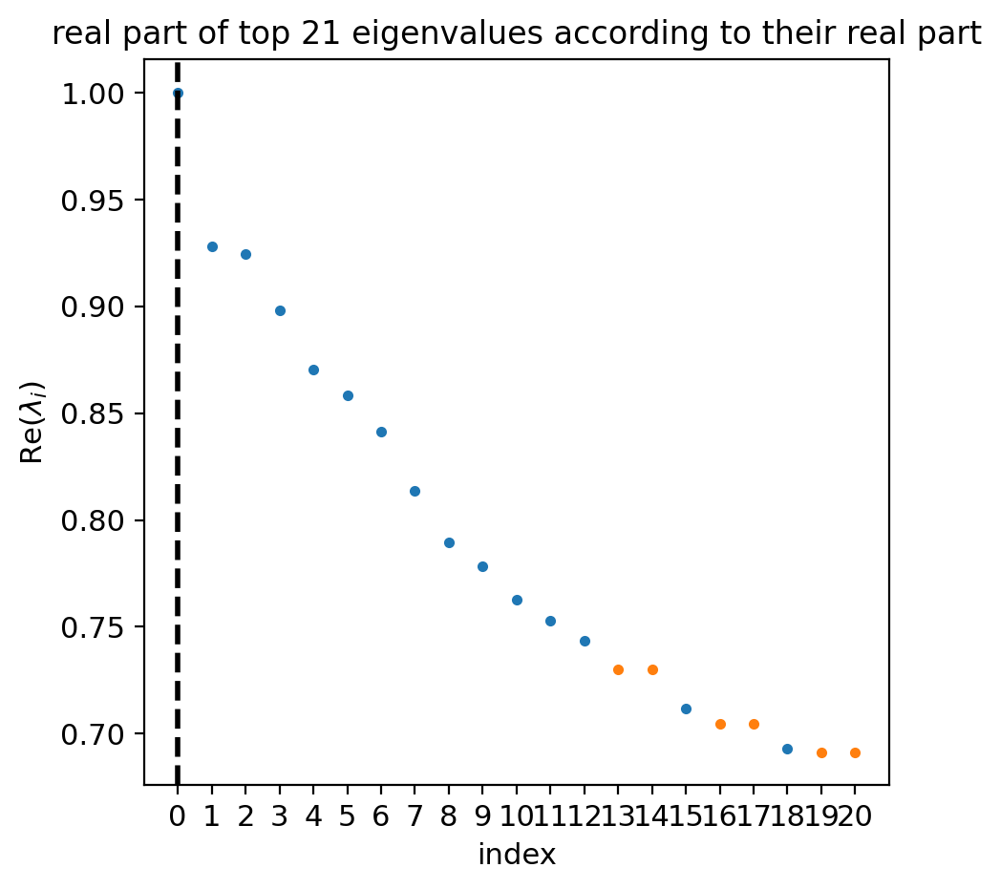

In [29]:
## compute schur decomposition
g.compute_schur(n_components=20)
g.plot_spectrum(real_only=True)

Computing `3` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_n_states_3.pdf


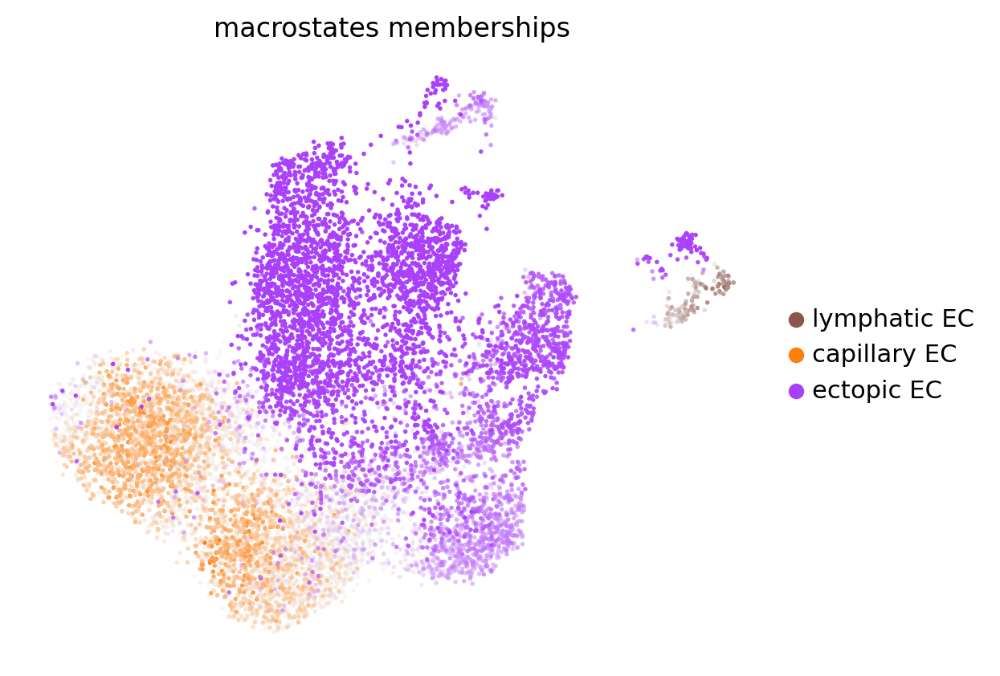

Computing `4` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_n_states_4.pdf


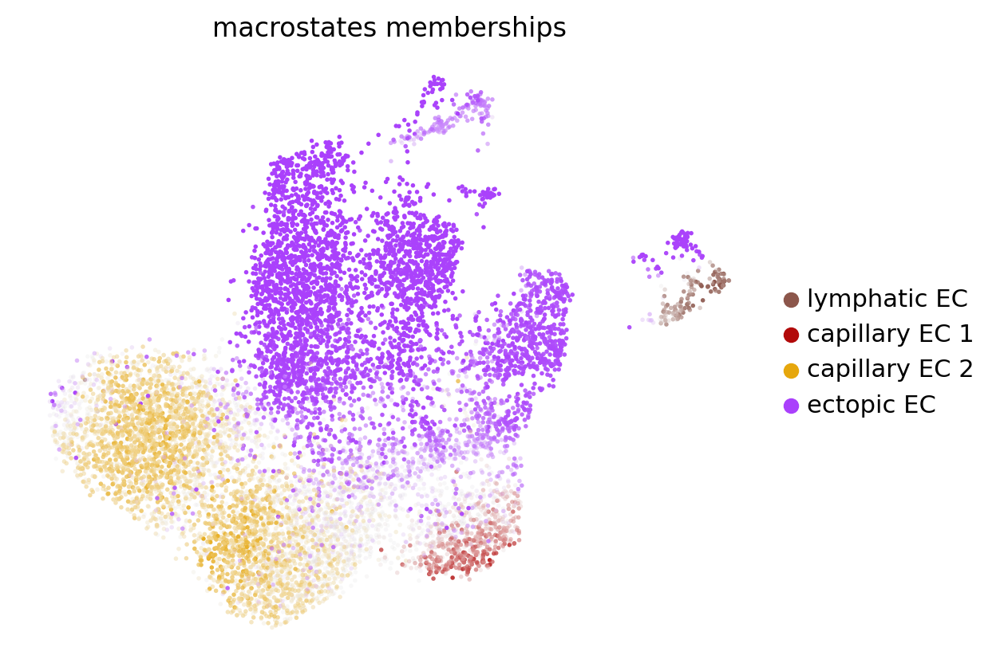

Computing `5` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_n_states_5.pdf


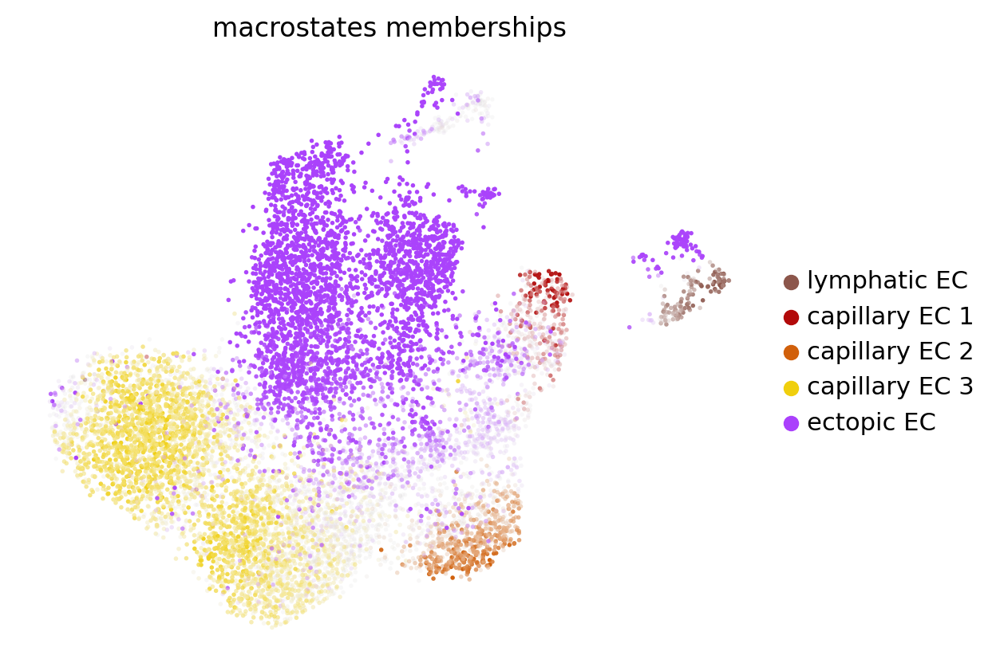

Computing `7` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:06)
saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_n_states_7.pdf


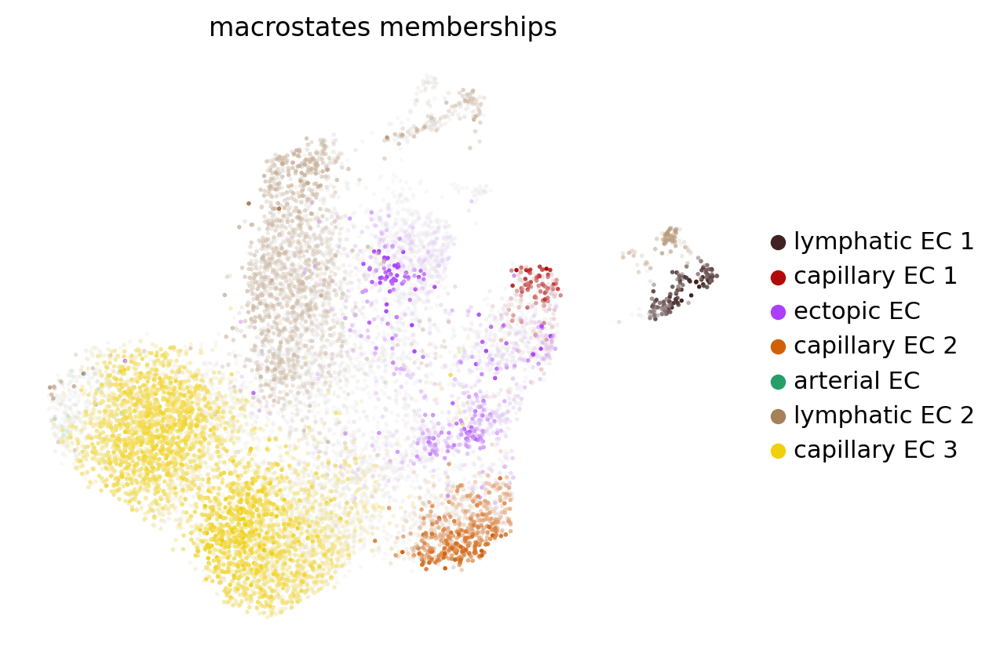

Computing `8` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:10)
saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_n_states_8.pdf


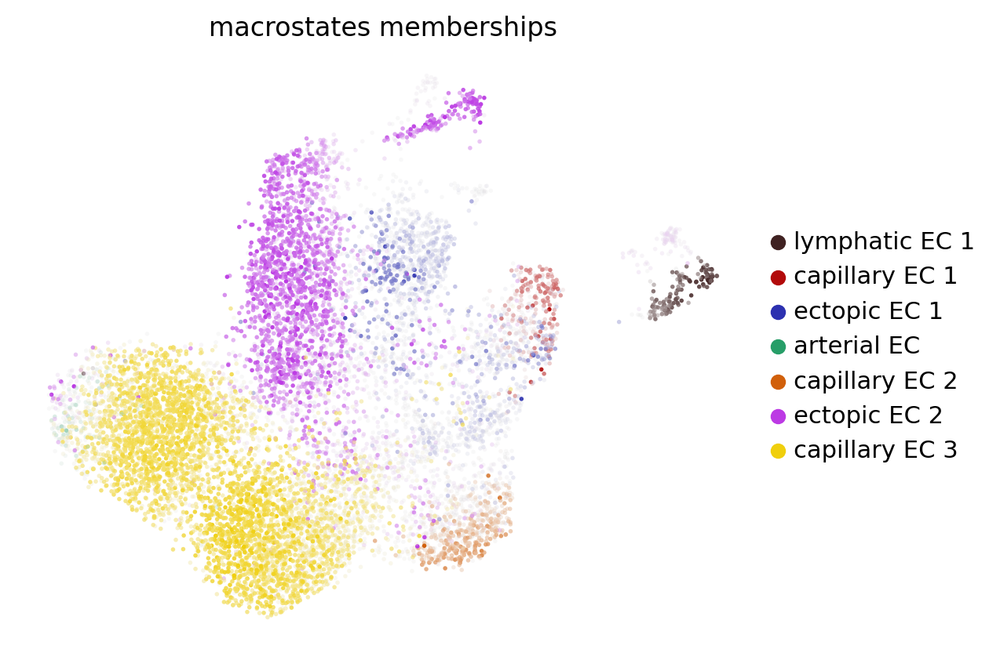

Computing `13` macrostates


In [ ]:
### show results for various number of macro states
#for n_states in [3, 4, 5, 7, 8, 13]:
#    g.compute_macrostates(cluster_key='cell_type', n_states=n_states)
#    g.plot_macrostates(legend_loc = 'right', discrete = False, save = f'n_states_{n_states}.pdf')

Computing `4` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


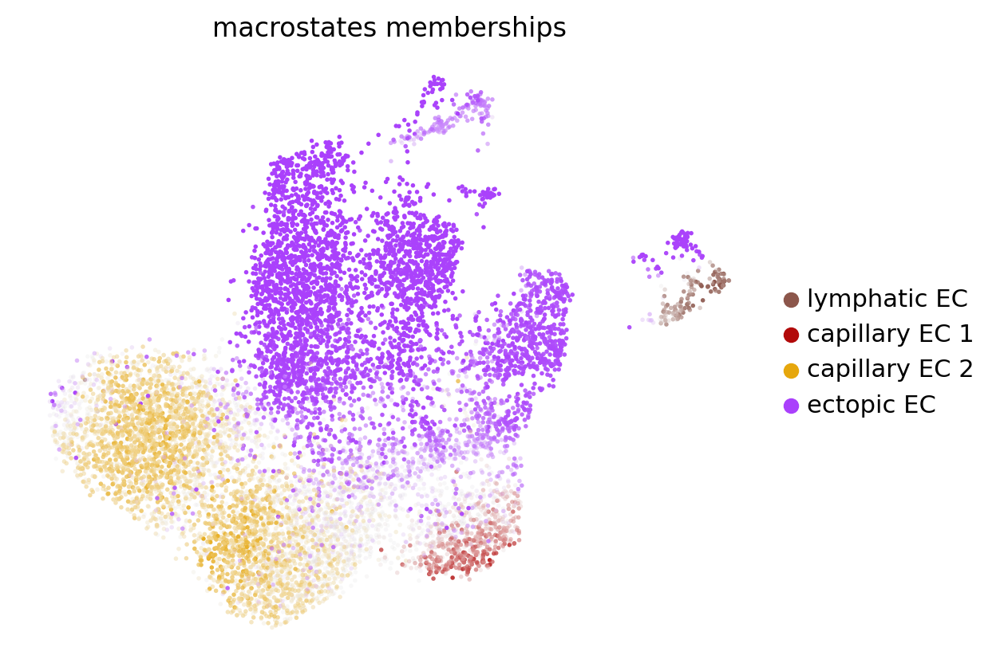

In [30]:
## decompose dynamics into 8 macrostates (8 would be valid alternatively)
n_states = 4
g.compute_macrostates(cluster_key='cell_type', n_states = n_states)
g.plot_macrostates(legend_loc = 'right', discrete = False)

saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_macrostates_side_by_side.pdf


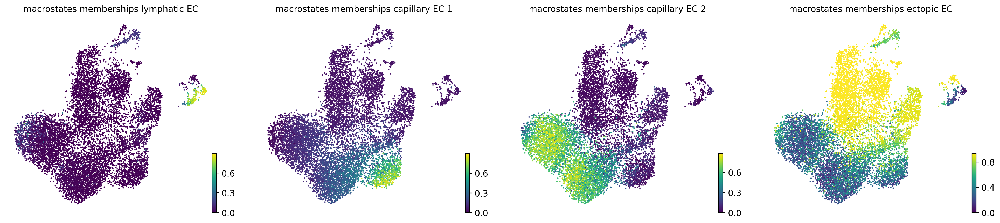

In [31]:
g.plot_macrostates(same_plot = False, save = 'cellrank_macrostates_side_by_side.pdf')

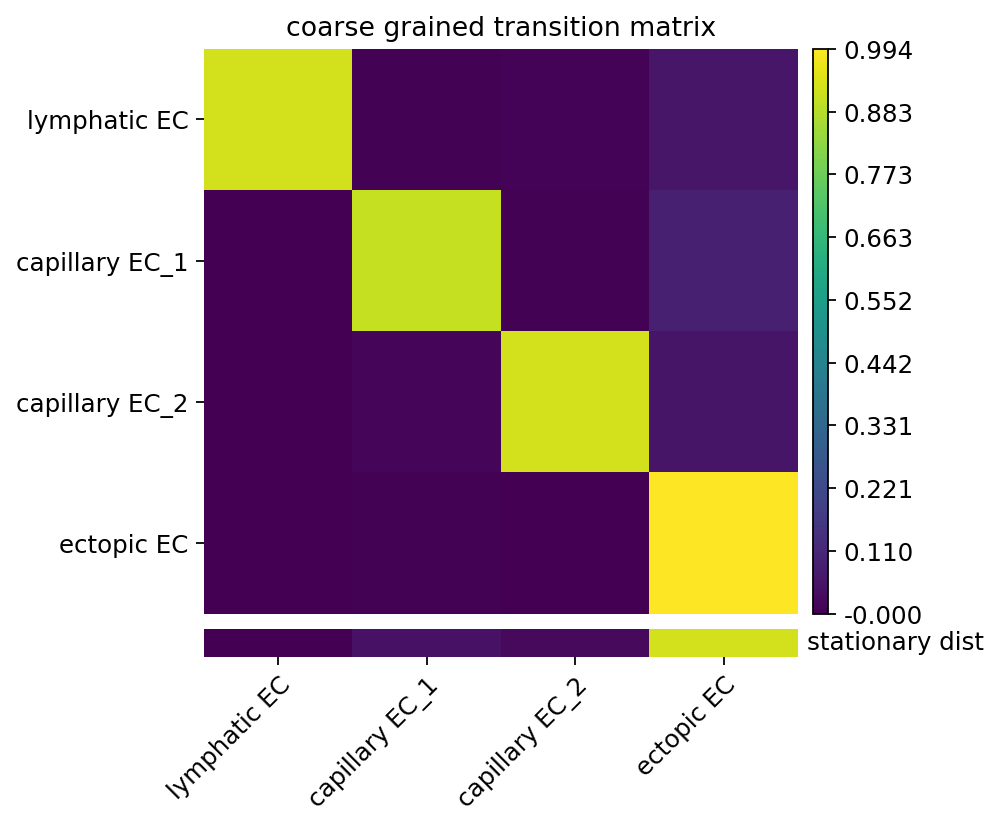

In [32]:
g.plot_coarse_T(title=f'coarse grained transition matrix', figsize=(5, 5), annotate=False,
                    show_stationary_dist=True,
                    save = 'cellrank_transition_matrix.pdf')

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


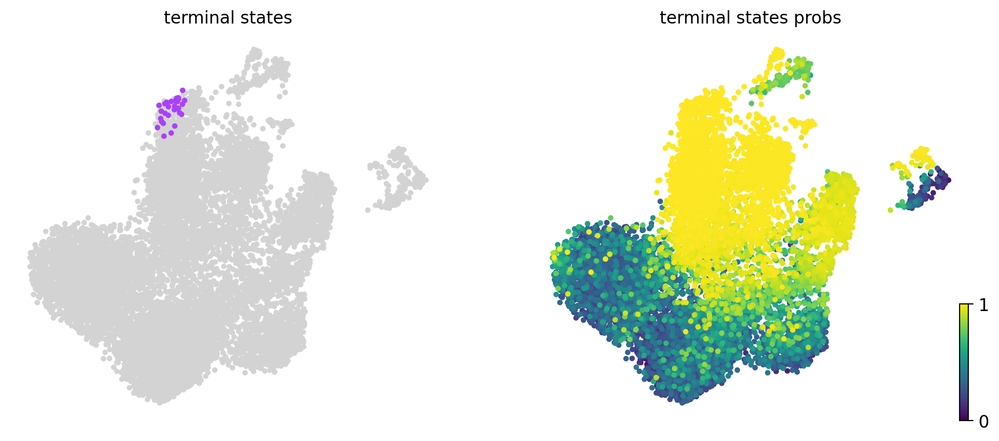

In [33]:
## compute terminal states
g.compute_terminal_states(n_cells=30, n_states=3)
scv.pl.scatter(adata, c=['terminal_states', 'terminal_states_probs'], color_map='viridis', size = 60)

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


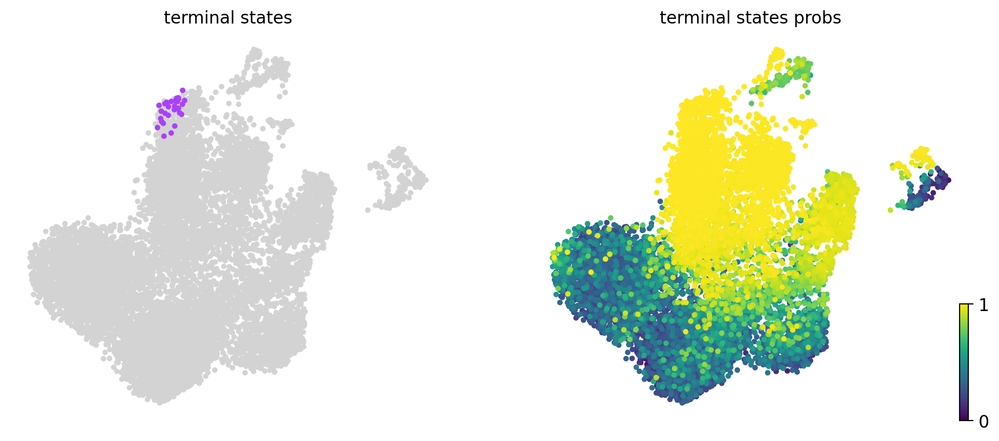

In [34]:
## set terminal states manually
g.set_terminal_states_from_macrostates(names=['ectopic EC'])
scv.pl.scatter(adata, c=['terminal_states', 'terminal_states_probs'], color_map='viridis', size = 60)

saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_terminal_states.pdf


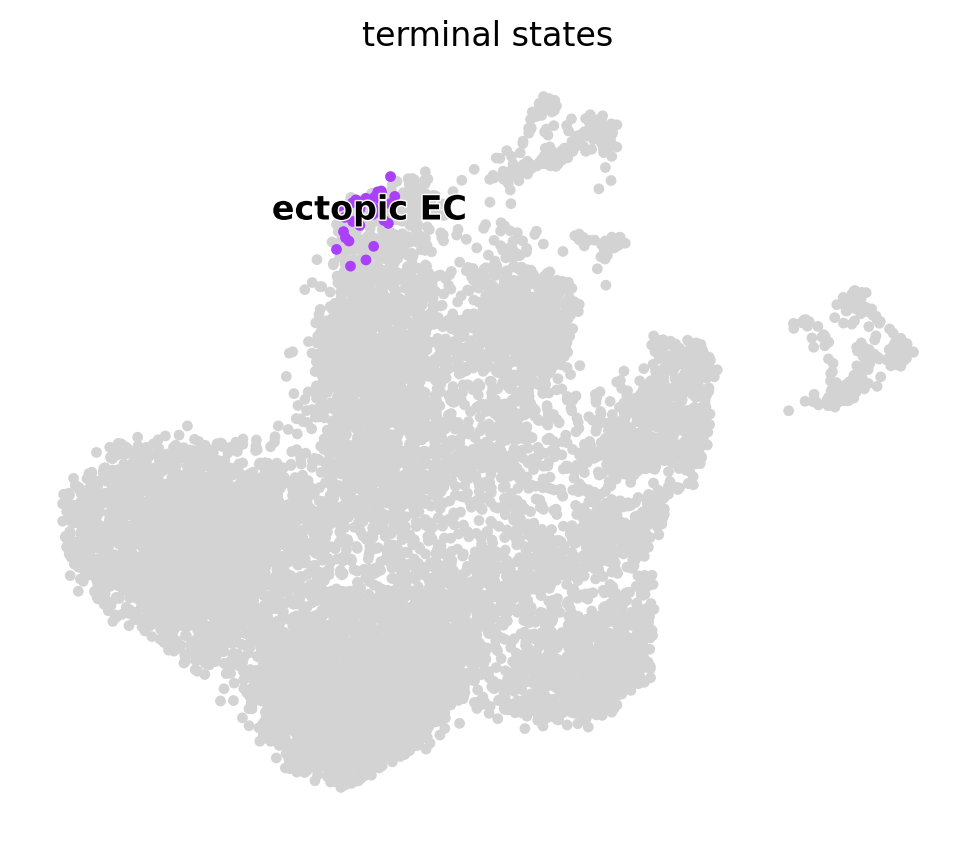

In [35]:
cr.pl.terminal_states(adata, size = 60, discrete = True, save = 'cellrank_terminal_states.pdf')

saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_terminal_states_probabilities.pdf


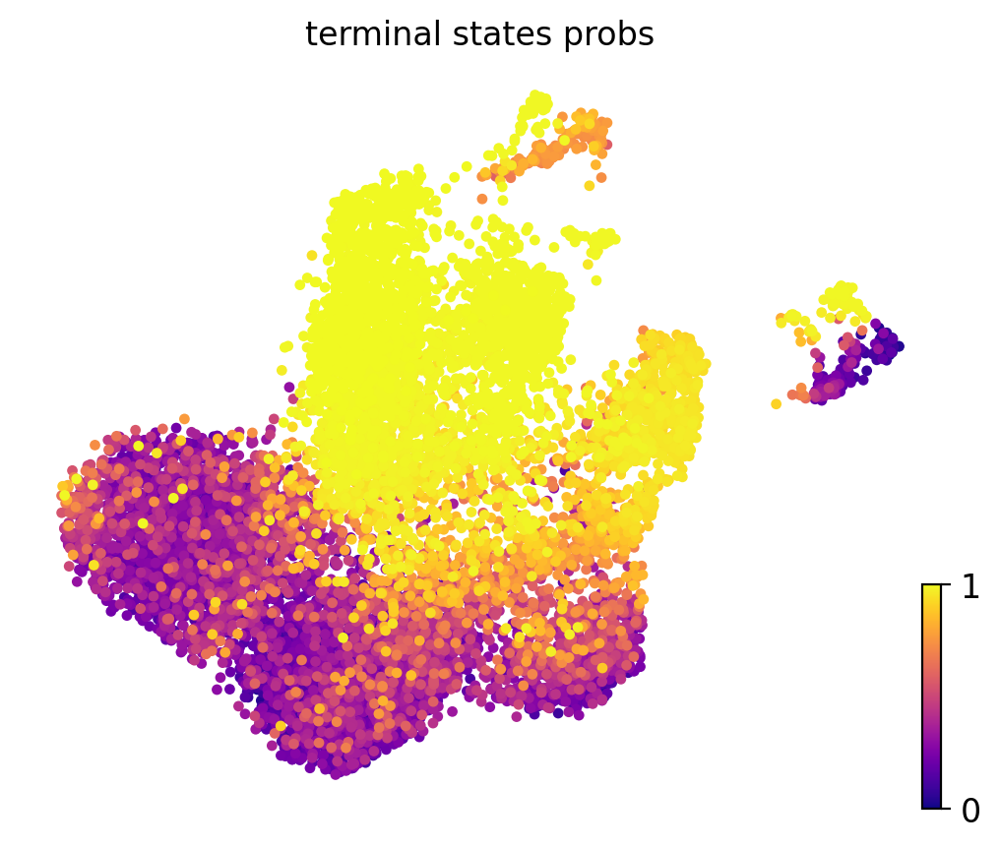

In [36]:
scv.pl.scatter(adata, c='terminal_states_probs', color_map='plasma', size = 60,
               save = 'cellrank_terminal_states_probabilities.pdf')

### (2) Compute Initial states

In [37]:
## compute initial states
g._compute_initial_states(n_states = 3)

Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_colors']`



saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_initial_states.pdf


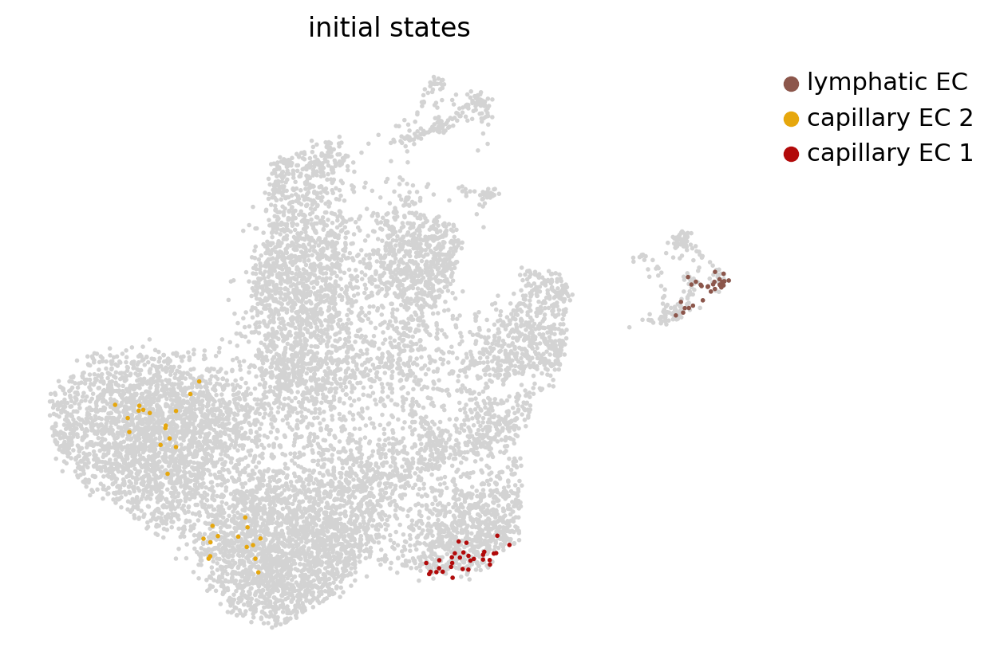

In [42]:
## visualise intial states 
scv.pl.scatter(adata, color = ['initial_states'], save = 'cellrank_initial_states.pdf')

saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_initial_states_probabilities.pdf


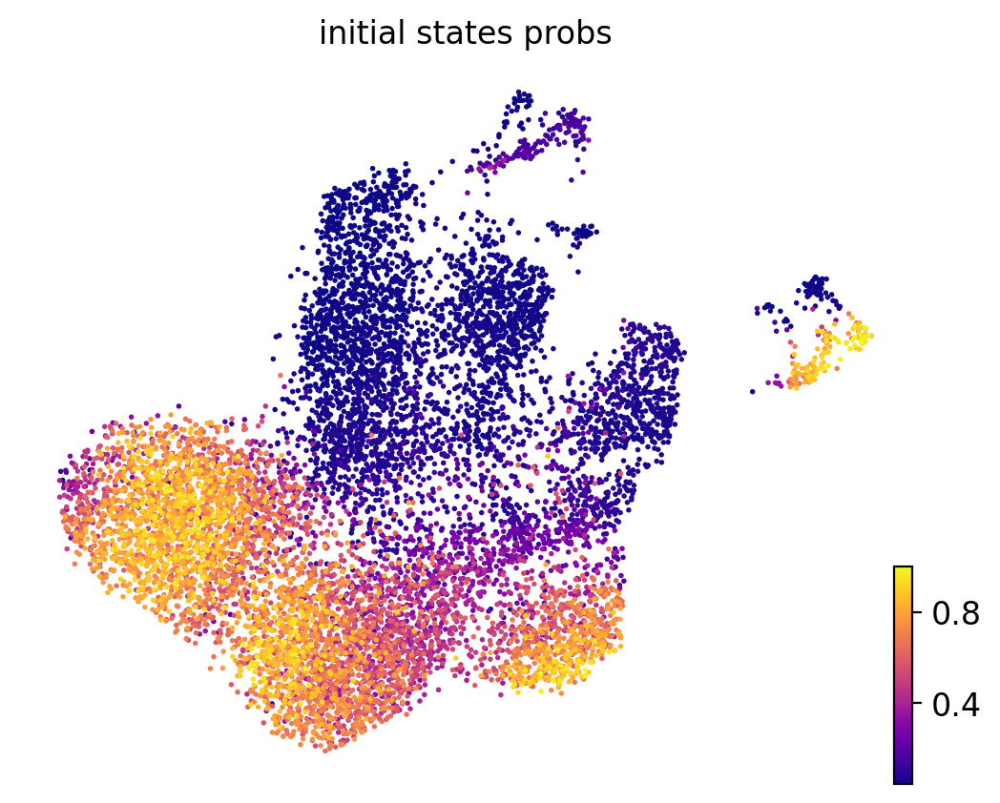

In [43]:
scv.pl.scatter(adata, color = ['initial_states_probs'], color_map='plasma',
               save = 'cellrank_initial_states_probabilities.pdf')

### Aggregate initial and terminal states

In [44]:
# utility
from cellrank.tl._utils import _merge_categorical_series

In [45]:
## utility function
def _create_initial_terminal_annotations(
    adata: AnnData,
    terminal_key: str = "terminal_states",
    initial_key: str = "initial_states",
    terminal_prefix: Optional[str] = "terminal",
    initial_prefix: Optional[str] = "initial",
    key_added: Optional[str] = "initial_terminal",
) -> None:
    """
    Create categorical annotations of both initial and terminal states.
    
    This is a utility function for creating a categorical :class:`pandas.Series` object which combines
    the information about initial and terminal states. The :class:`pandas.Series` is written directly
    to the :class:`anndata.AnnData`object. This can for example be used to create a scatter plot in :mod:`scvelo`.
    Parameters
    ----------
    adata
        AnnData object to write to ``.obs[key_added]``.
    terminal_key
        Key from ``adata.obs`` where terminal states have been saved.
    initial_key
        Key from ``adata.obs`` where initial states have been saved.
    terminal_prefix
        Forward direction prefix used in the annotations.
    initial_prefix
        Backward direction prefix used in the annotations.
    key_added
        Key added to ``adata.obs``.
    Returns
    -------
    None
        Nothing, just writes to ``adata``.
    """

    # get both Series objects
    cats_final, colors_final = (
        adata.obs[terminal_key],
        adata.uns[f"{terminal_key}_colors"],
    )
    cats_root, colors_root = adata.obs[initial_key], adata.uns[f"{initial_key}_colors"]

    # merge
    cats_merged, colors_merged = _merge_categorical_series(
        cats_final,
        cats_root,
        colors_old=list(colors_final),
        colors_new=list(colors_root),
    )

    # adjust the names
    final_names = cats_final.cat.categories
    final_labels = [
        f"{terminal_prefix if key in final_names else initial_prefix}: {key}"
        for key in cats_merged.cat.categories
    ]
    cats_merged = cats_merged.cat.rename_categories(final_labels)

    # write to AnnData
    adata.obs[key_added] = cats_merged
    adata.uns[f"{key_added}_colors"] = colors_merged


saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_initial_terminal_states.pdf


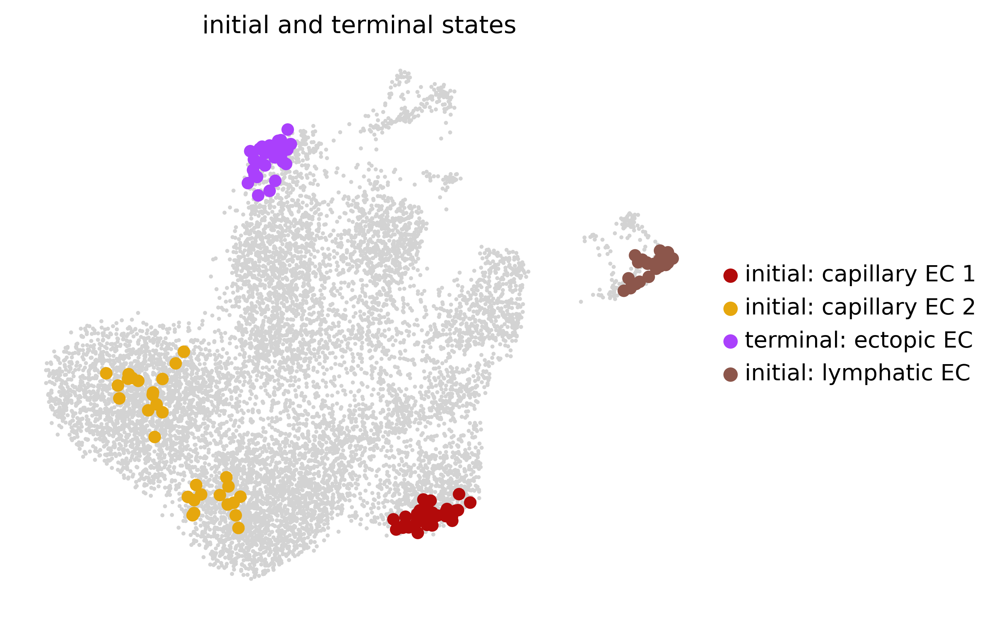

In [46]:
_create_initial_terminal_annotations(adata, terminal_key = 'terminal_states')

scv.pl.scatter(adata,  title = 'initial and terminal states', legend_loc = 'right',
               color = 'initial_terminal', dpi = 200, s = 150, 
               save = 'cellrank_initial_terminal_states.pdf'
              )

### Visualize intial state and termin state probabilities

saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_initial_terminal_states_probabilities.pdf


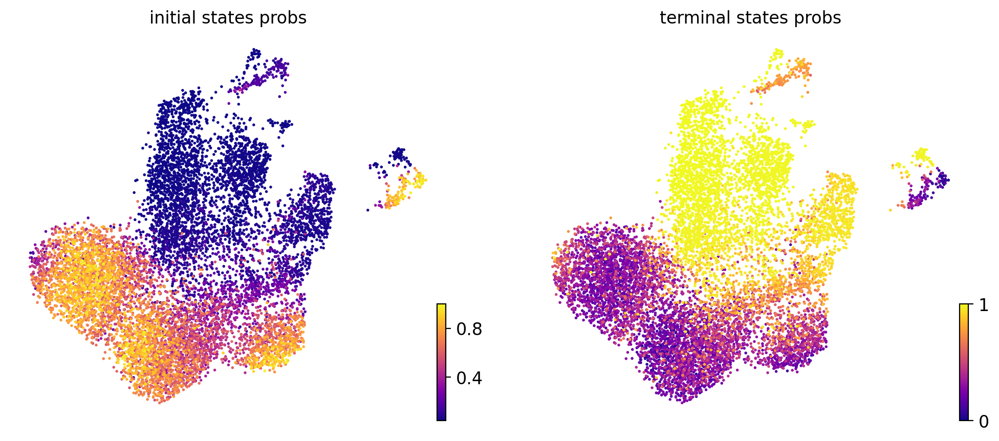

In [52]:
scv.pl.scatter(adata, color=['initial_states_probs', 'terminal_states_probs'], color_map='plasma',
               save = 'cellrank_initial_terminal_states_probabilities.pdf'
              )

In [53]:
## recover latent time
scv.tl.recover_latent_time(adata, root_key='initial_states_probs', end_key='terminal_states_probs')

computing latent time using initial_states_probs, terminal_states_probs as prior
    finished (0:00:01) --> added 
    'latent_time', shared time (adata.obs)


saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_latent_time.pdf


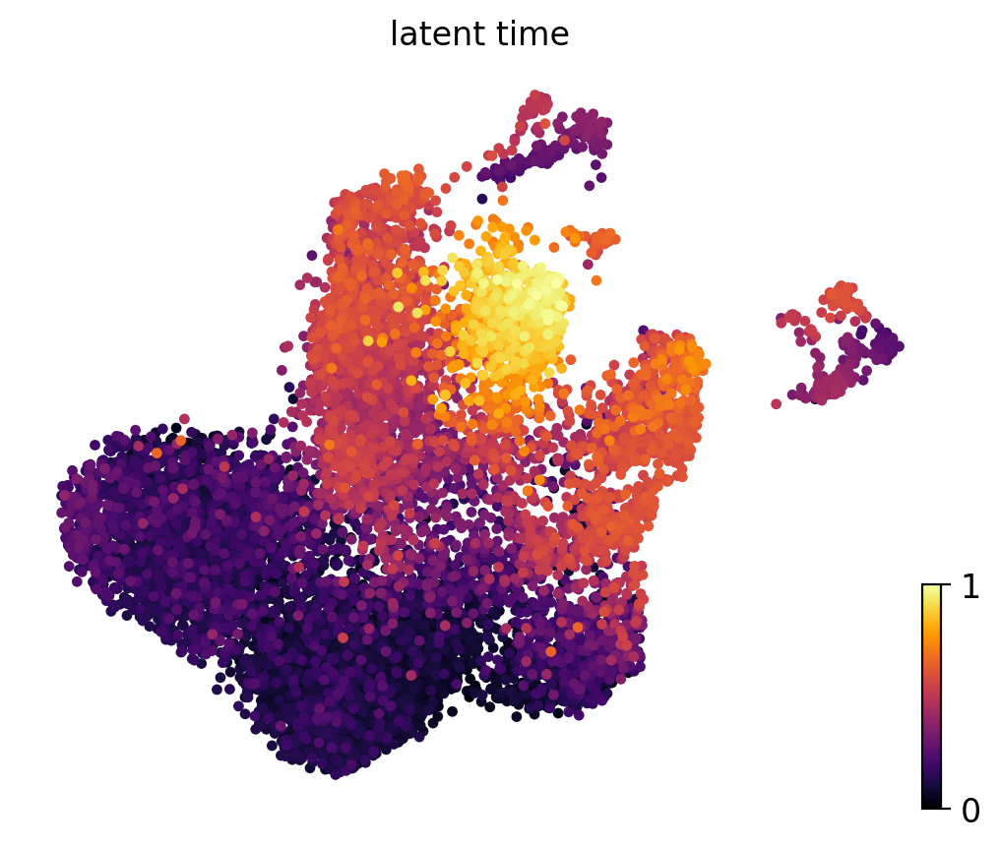

In [54]:
## plot latent time
scv.pl.scatter(adata, color=['latent_time'], color_map='inferno', size = 60,
               save = 'cellrank_latent_time.pdf')

In [55]:
## visualise fate probabilities in directed PAGA
scv.tl.paga(adata, groups= 'cell_type', root_key = 'initial_states_probs', end_key = 'terminal_states_probs', 
            use_time_prior='velocity_pseudotime')

running PAGA using priors: ['velocity_pseudotime', 'initial_states_probs', 'terminal_states_probs']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


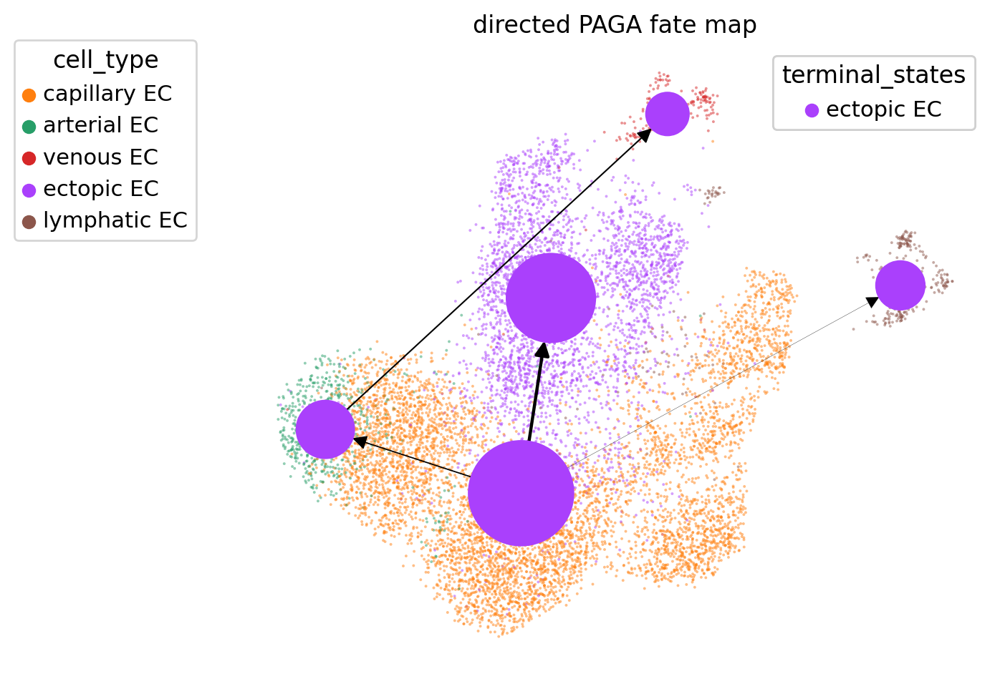

In [56]:
## plot directed PAGA
cr.pl.cluster_fates(adata, cluster_key = 'cell_type', mode = 'paga_pie', basis = 'umap',
                    dashed_edges = None, legend_loc = 'top left out', node_size_scale = 5,
                    edge_width_scale = 1, max_edge_width = 4, title = f'directed PAGA fate map',
                    save = 'cellrank_directed_PAGA.pdf')

### ectopic EC differentiation

In [57]:
## compute diffusion pseudotime
# starting from CellRank defined root cell
root_idx = np.where(adata.obs['initial_states'] == 'capillary EC_1')[0][0]
adata.uns['iroot'] = root_idx
sc.tl.diffmap(adata)
sc.tl.dpt(adata)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9844229  0.98119134 0.9759861  0.96896064 0.9606738
     0.95958567 0.9571845  0.94004893 0.9341011  0.9243618  0.90627193
     0.8981707  0.8939677  0.8914674 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


saving figure to file /home/niklas/projects/niche_environments_FIBROSIS/HUMAN_exvivo/02_figures/ASK_joint/endothelia_subset/scvelo_cellrank_endothelia_time_UMAPs.pdf


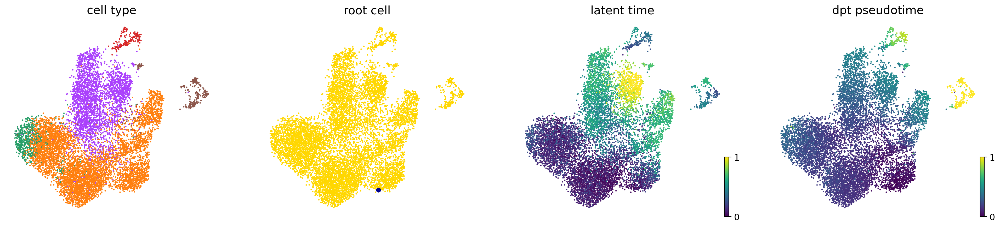

In [58]:
scv.pl.scatter(adata,
               color=['cell_type', root_idx, 'latent_time', 'dpt_pseudotime'],
               fontsize=16,
               cmap='viridis',
               perc=[2, 98],
               colorbar=True,
               rescale_color=[0, 1],
               title=['cell type', 'root cell', 'latent time', 'dpt pseudotime'],
               save = 'cellrank_endothelia_time_UMAPs.pdf')